In [ ]:
import pandas as pd
data=pd.read_csv('/content/breast-cancer.csv')

In [ ]:
data.head()

In [ ]:
from sklearn.preprocessing import LabelEncoder
encoder=LabelEncoder()
data['diagnosis']=encoder.fit_transform(data['diagnosis'])

In [ ]:
data.corr()['diagnosis']

In [ ]:
data=data.drop(columns=['id','symmetry_se','smoothness_se','fractal_dimension_mean','texture_se'])

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

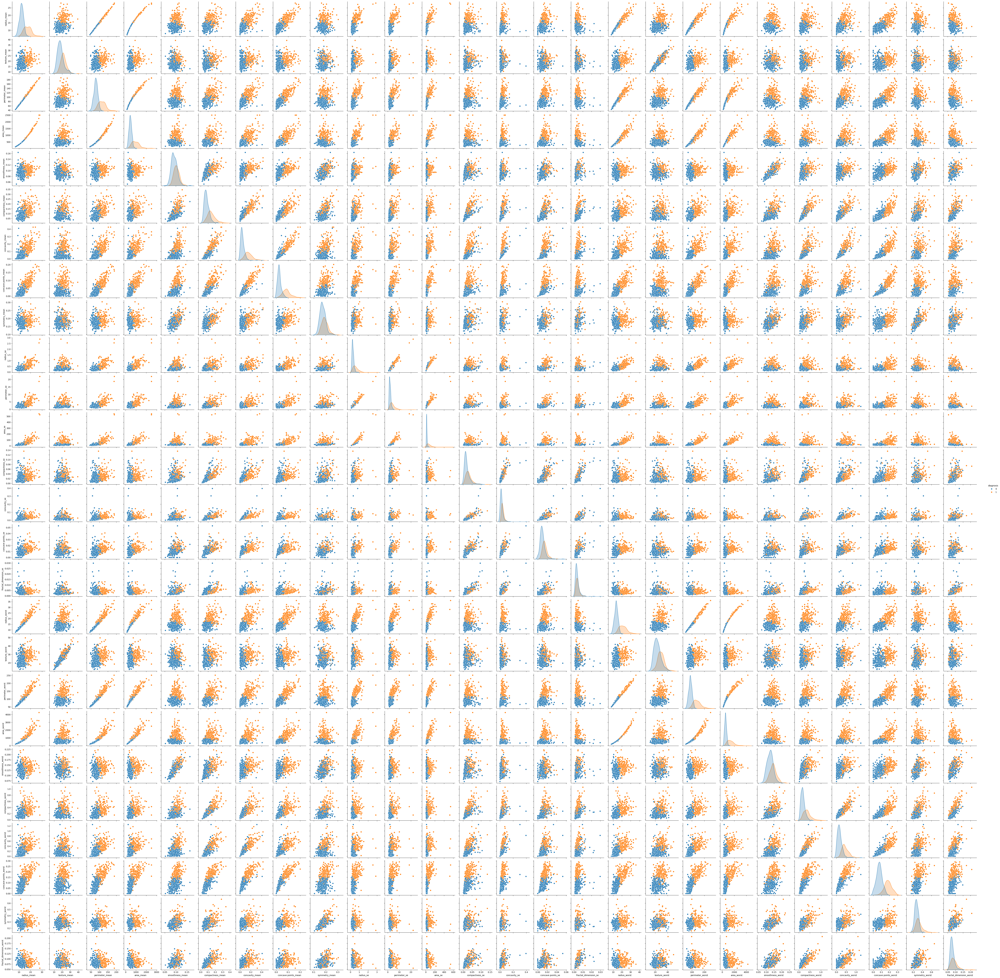

In [12]:
sns.pairplot(data,hue='diagnosis')

In [13]:
y=data['diagnosis']
x=data.drop(columns=['diagnosis'])

In [14]:
x.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,radius_se,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,1.0950,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.5435,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.7456,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.4956,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.7572,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [15]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import tensorflow
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Dropout
from tensorflow.keras.callbacks import EarlyStopping


In [16]:
pip install keras

In [18]:
scaler=StandardScaler()


In [19]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

In [20]:
x_train=scaler.fit_transform(x_train)
x_test=scaler.transform(x_test)

In [45]:
columns=data.columns

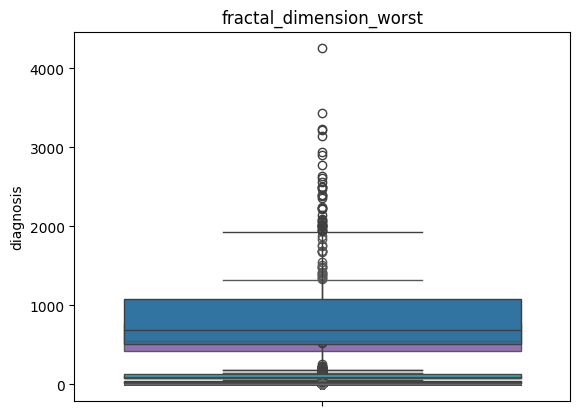

In [46]:
for col in columns:
  sns.boxplot(data[col])
  plt.title(col)

In [17]:
import keras

In [42]:
def build(hp):
  model=Sequential()
  counter=0
  for i in range(hp.Int('num_layers',min_value=1,max_value=10)):
    if counter==0:
      model.add(Dense(hp.Int('units'+str(i),min_value=64,max_value=1024,step=64),input_dim=(x_train.shape[1]),
                  activation=hp.Choice('activation'+str(i),values=['relu','tanh','sigmoid'])))
      model.add(Dropout(hp.Choice('dropout'+str(i),values=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9])))
    else:
      model.add(Dense(hp.Int('units'+str(i),min_value=64,max_value=1024,step=64),
                  activation=hp.Choice('activation'+str(i),values=['relu','tanh','sigmoid'])))
      model.add(Dropout(hp.Choice('dropout'+str(i),values=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9])))
    counter+=1
  model.add(Dense(1,activation='sigmoid'))
  model.compile(optimizer=keras.optimizers.Adam(hp.Choice('learning_rate',[1e-2,1e-3,1e-4])),
                                                  loss='binary_crossentropy',
                                                  metrics=['accuracy'])
  return model

In [25]:
pip install keras-tuner

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 11.0 MB/s eta 0:00:00


In [26]:
import keras_tuner as kt

In [43]:
tuner=kt.RandomSearch(build,objective='val_accuracy',max_trials=10)

Reloading Tuner from ./untitled_project/tuner0.json


In [44]:
tuner.search(x_train,y_train,epochs=20,validation_data=(x_test,y_test))

Trial 10 Complete [00h 00m 20s]
val_accuracy: 0.9824561476707458

Best val_accuracy So Far: 0.9912280440330505
Total elapsed time: 00h 03m 42s
